In [1]:
import pandas as pd

In [2]:
df = pd.read_csv(r'C:\Users\Shin\Desktop\for-kr-pjt\NoonMap-Project\data\file_data\병합DB_2차.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7457002 entries, 0 to 7457001
Data columns (total 14 columns):
 #   Column              Dtype  
---  ------              -----  
 0   Unnamed: 0          int64  
 1   bridge_name         object 
 2   address             object 
 3   etc_address         object 
 4   latitude            float64
 5   longitude           float64
 6   brid_height_origin  float64
 7   location_start      object 
 8   wl_station_code     int64  
 9   station_name        object 
 10  location            object 
 11  obs_date            object 
 12  WL                  float64
 13  bridge_height       float64
dtypes: float64(5), int64(2), object(7)
memory usage: 796.5+ MB


In [4]:
df['obs_date'] = pd.to_datetime(df['obs_date'])

In [5]:
bridge_list = pd.unique(df['location_start']).tolist()

In [6]:
len(bridge_list)

86

In [7]:
print(df.columns)

Index(['Unnamed: 0', 'bridge_name', 'address', 'etc_address', 'latitude',
       'longitude', 'brid_height_origin', 'location_start', 'wl_station_code',
       'station_name', 'location', 'obs_date', 'WL', 'bridge_height'],
      dtype='object')


In [8]:
# 교량을 기준으로 데이터프레임 분리
df_list = [df[df['location_start']==i] for i in bridge_list]

In [10]:
# 불필요한 열 제거, 날짜순으로 정렬 뒤 인덱스 재설정
for i in range(len(bridge_list)):
    df_list[i] = df_list[i].drop(columns=['Unnamed: 0', 'bridge_name', 'address', 'etc_address', 'latitude', 'longitude',
                                           'brid_height_origin', 'location_start', 'wl_station_code', 'station_name',
                                           'location', 'bridge_height'])
    df_list[i].sort_values(['obs_date'], inplace=True)
    df_list[i].reset_index(drop=True, inplace=True)
    df_list[i].rename({'obs_date':'time', 'WL':'value'}, axis=1, inplace=True)

In [11]:
df_list[0]

,time,value
0,2016-11-09 01:00:00,145.0
1,2016-11-09 02:00:00,145.0
2,2016-11-09 03:00:00,145.0
3,2016-11-09 04:00:00,146.0
4,2016-11-09 05:00:00,146.0
...,...,...
33252,2020-08-26 21:00:00,198.0
33253,2020-08-26 22:00:00,200.0
33254,2020-08-26 23:00:00,202.0
33255,2020-08-27 00:00:00,204.0


In [12]:
import matplotlib.pyplot as plt

In [13]:
import numpy as np

In [14]:
from datetime import datetime 

In [15]:
from sklearn.model_selection import train_test_split

In [16]:
# 각 데이터프레임마다 test data의 비율이 0.5가 되도록 설정
split_date = []
for i in range(len(df_list)):
    idx = len(train_test_split(df_list[i], test_size=.5)[0])
    split_date.append(df_list[i]['time'][idx])

In [17]:
split_date

[Timestamp('2018-10-03 06:00:00'),
 Timestamp('2015-04-28 17:00:00'),
 Timestamp('2018-04-15 14:00:00'),
 Timestamp('2018-04-15 14:00:00'),
 Timestamp('2016-08-18 06:00:00'),
 Timestamp('2019-02-17 06:00:00'),
 Timestamp('2015-07-26 07:00:00'),
 Timestamp('2015-05-24 22:00:00'),
 Timestamp('2015-03-19 23:00:00'),
 Timestamp('2015-04-27 00:00:00'),
 Timestamp('2015-04-27 00:00:00'),
 Timestamp('2018-06-05 01:00:00'),
 Timestamp('2015-07-11 19:00:00'),
 Timestamp('2015-12-26 01:00:00'),
 Timestamp('2015-04-29 21:00:00'),
 Timestamp('2015-04-26 09:00:00'),
 Timestamp('2015-05-21 10:00:00'),
 Timestamp('2017-04-27 14:00:00'),
 Timestamp('2018-10-03 07:00:00'),
 Timestamp('2015-04-17 09:00:00'),
 Timestamp('2015-04-30 08:00:00'),
 Timestamp('2019-12-03 14:00:00'),
 Timestamp('2015-09-04 04:00:00'),
 Timestamp('2015-06-20 20:00:00'),
 Timestamp('2017-04-27 18:00:00'),
 Timestamp('2015-10-30 20:00:00'),
 Timestamp('2015-05-26 16:00:00'),
 Timestamp('2015-11-15 16:00:00'),
 Timestamp('2015-04-

In [18]:
train_value = [df_list[i][df_list[i]['time'] < split_date[i]]['value'] for i in range(len(df_list))]

In [19]:
test_value = [df_list[i][df_list[i]['time'] >= split_date[i]]['value'] for i in range(len(df_list))]

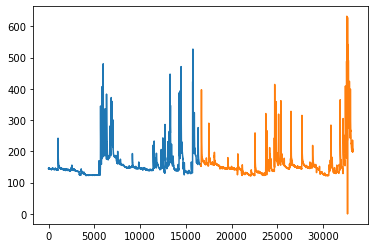

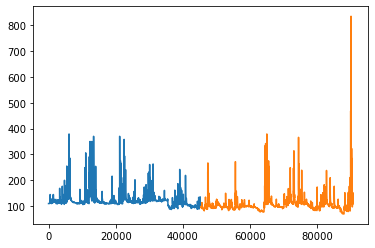

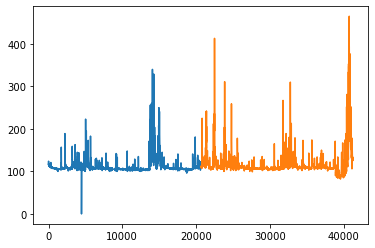

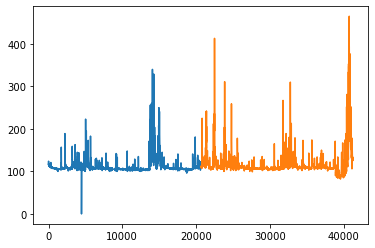

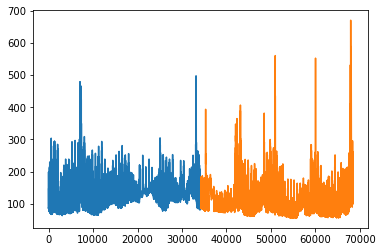

...

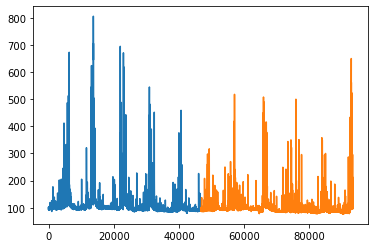

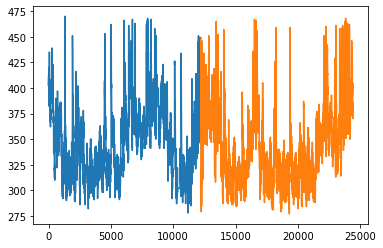

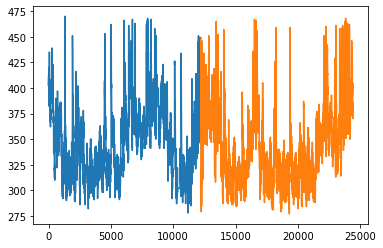

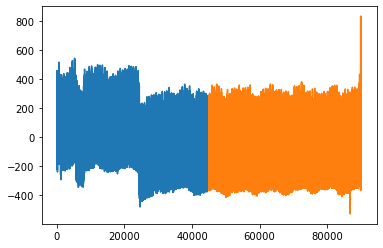

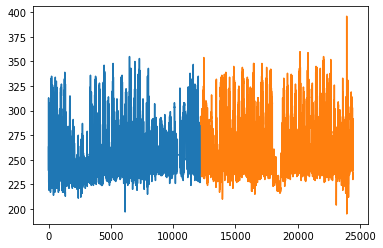

In [20]:
# 파란색 그래프: train data, 노란색 그래프: test data
for i in range(len(df_list)):
    ax = train_value[i].plot()
    test_value[i].plot(ax=ax)
    plt.show()

In [21]:
from sklearn.preprocessing import MinMaxScaler

In [22]:
sc = [MinMaxScaler() for i in range(len(df_list))]

In [23]:
train_arr = [np.array(train_value[i]).reshape(-1,1) for i in range(len(df_list))]

In [24]:
test_arr = [np.array(test_value[i]).reshape(-1,1) for i in range(len(df_list))]

In [25]:
train_sc = [sc[i].fit_transform(train_arr[i]) for i in range(len(df_list))]
test_sc = [sc[i].transform(test_arr[i]) for i in range(len(df_list))]

In [26]:
train_sc[0]

array([[0.05445545],
       [0.05445545],
       [0.05445545],
       ...,
       [0.07920792],
       [0.07920792],
       [0.07920792]])

In [27]:
train = [df_list[i][df_list[i]['time'] < split_date[i]] for i in range(len(df_list))]
test = [df_list[i][df_list[i]['time'] >= split_date[i]] for i in range(len(df_list))]

In [28]:
for i in range(len(df_list)):
    train[i] = train[i].set_index('time')
    test[i] = test[i].set_index('time')

In [29]:
train[0].head(10)

,value
time,
2016-11-09 01:00:00,145.0
2016-11-09 02:00:00,145.0
2016-11-09 03:00:00,145.0
2016-11-09 04:00:00,146.0
2016-11-09 05:00:00,146.0
2016-11-09 06:00:00,146.0
2016-11-09 07:00:00,146.0
2016-11-09 08:00:00,146.0
2016-11-09 09:00:00,146.0


In [30]:
train_sc_df = [pd.DataFrame(train_sc[i], columns=['std_value'], index=train[i].index) for i in range(len(df_list))]
test_sc_df = [pd.DataFrame(test_sc[i], columns=['std_value'], index=test[i].index)for i in range(len(df_list))]

In [31]:
train_sc_df[0].head(10)

,std_value
time,
2016-11-09 01:00:00,0.054455
2016-11-09 02:00:00,0.054455
2016-11-09 03:00:00,0.054455
2016-11-09 04:00:00,0.056931
2016-11-09 05:00:00,0.056931
2016-11-09 06:00:00,0.056931
2016-11-09 07:00:00,0.056931
2016-11-09 08:00:00,0.056931
2016-11-09 09:00:00,0.056931


In [32]:
for i in range(len(df_list)):
    train[i]['std_value'] = train_sc_df[i]['std_value']
    test[i]['std_value'] = test_sc_df[i]['std_value']
    train[i].drop(['value'], axis=1, inplace=True)
    test[i].drop(['value'], axis=1, inplace=True)

In [33]:
train[0].head(10)

,std_value
time,
2016-11-09 01:00:00,0.054455
2016-11-09 02:00:00,0.054455
2016-11-09 03:00:00,0.054455
2016-11-09 04:00:00,0.056931
2016-11-09 05:00:00,0.056931
2016-11-09 06:00:00,0.056931
2016-11-09 07:00:00,0.056931
2016-11-09 08:00:00,0.056931
2016-11-09 09:00:00,0.056931


In [34]:
for i in range(len(df_list)):
    for s in range(12):
        train[i]['shift_{}'.format(s)] = train[i]['std_value'].shift(s)
        test[i]['shift_{}'.format(s)] = test[i]['std_value'].shift(s)

In [35]:
train[0].head()

,std_value,shift_0,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11
time,,,,,,,,,,,,,
2016-11-09 01:00:00,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-09 02:00:00,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-09 03:00:00,0.054455,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-09 04:00:00,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-11-09 05:00:00,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
X_train = [train[i].dropna().drop('std_value', axis=1) for i in range(len(df_list))]
y_train = [train[i].dropna()[['std_value']] for i in range(len(df_list))]
X_test = [test[i].dropna().drop('std_value', axis=1) for i in range(len(df_list))]
y_test = [test[i].dropna()[['std_value']] for i in range(len(df_list))]

In [37]:
X_train[0].head()

,shift_0,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11
time,,,,,,,,,,,,
2016-11-09 12:00:00,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455
2016-11-09 13:00:00,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455
2016-11-09 14:00:00,0.054455,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455
2016-11-09 15:00:00,0.054455,0.054455,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931
2016-11-09 16:00:00,0.054455,0.054455,0.054455,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931


In [38]:
y_train[0].head(10)

,std_value
time,
2016-11-09 12:00:00,0.054455
2016-11-09 13:00:00,0.054455
2016-11-09 14:00:00,0.054455
2016-11-09 15:00:00,0.054455
2016-11-09 16:00:00,0.054455
2016-11-09 17:00:00,0.054455
2016-11-09 18:00:00,0.054455
2016-11-09 19:00:00,0.051980
2016-11-09 20:00:00,0.054455


In [39]:
print(type(X_train[0]))

<class 'pandas.core.frame.DataFrame'>


In [40]:
X_train = [X_train[i].values for i in range(len(df_list))]
print(type(X_train[0]))

<class 'numpy.ndarray'>


In [41]:
X_test= [X_test[i].values for i in range(len(df_list))]
y_train = [y_train[i].values for i in range(len(df_list))]
y_test = [y_test[i].values for i in range(len(df_list))]

In [42]:
print(X_train[0].shape)
print(y_train[0].shape)

(16617, 12)
(16617, 1)


In [43]:
X_train_t = [X_train[i].reshape(X_train[i].shape[0], 12, 1) for i in range(len(df_list))]
X_test_t = [X_test[i].reshape(X_test[i].shape[0], 12, 1) for i in range(len(df_list))]

In [44]:
print('최종 data')
for i in range(len(df_list)):
    print('dataframe index: ', i)
    print(X_train_t[i].shape)
    print(X_test_t[i].shape)

최종 data
dataframe index:  0
(16617, 12, 1)
(16618, 12, 1)
dataframe index:  1
(45308, 12, 1)
(45308, 12, 1)
dataframe index:  2
(20625, 12, 1)
(20625, 12, 1)
dataframe index:  3
(20625, 12, 1)
(20625, 12, 1)
dataframe index:  4
(34202, 12, 1)
(34203, 12, 1)
dataframe index:  5
(13329, 12, 1)
(13330, 12, 1)
dataframe index:  6
(43923, 12, 1)
(43923, 12, 1)
dataframe index:  7
(45347, 12, 1)
(45348, 12, 1)
dataframe index:  8
(41980, 12, 1)
(41980, 12, 1)
dataframe index:  9
(46353, 12, 1)
(46353, 12, 1)
dataframe index:  10
(46353, 12, 1)
(46353, 12, 1)
dataframe index:  11
(12867, 12, 1)
(12867, 12, 1)
dataframe index:  12
(44301, 12, 1)
(44301, 12, 1)
dataframe index:  13
(40847, 12, 1)
(40848, 12, 1)
dataframe index:  14
(46643, 12, 1)
(46643, 12, 1)
dataframe index:  15
(39596, 12, 1)
(39597, 12, 1)
dataframe index:  16
(40567, 12, 1)
(40567, 12, 1)
dataframe index:  17
(29177, 12, 1)
(29177, 12, 1)
dataframe index:  18
(16618, 12, 1)
(16618, 12, 1)
dataframe index:  19
(46343, 12, 

In [45]:
from keras.layers import GRU
from keras.models import Sequential
from keras.layers import Dense
import keras.backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
import os

In [56]:
K.clear_session()

In [57]:
model = Sequential() # Sequeatial Model 
model.add(GRU(20, input_shape=(12, 1))) # (timestep, feature) 
model.add(Dense(1)) # output = 1 
model.compile(loss='mean_squared_error', optimizer='adam') 
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru (GRU)                    (None, 20)                1380      
_________________________________________________________________
dense (Dense)                (None, 1)                 21        
Total params: 1,401
Trainable params: 1,401
Non-trainable params: 0
_________________________________________________________________


In [58]:
model_list = [model for i in range(len(df_list))]

In [59]:
early_stop = EarlyStopping(monitor='loss', patience=5, verbose=1)

In [61]:
hist_list = []
for i in range(len(df_list)):
    MODEL_DIR = './model/'+str(i)+'/'
    if not os.path.exists(MODEL_DIR):      
        os.makedirs(MODEL_DIR)

    modelpath = MODEL_DIR+'{epoch:02d}-{val_loss:.4f}.hdf5'
    checkpointer = ModelCheckpoint(filepath = modelpath, monitor='loss', verbose = 1, save_best_only = True)
    
    hist_list.append(model_list[i].fit(X_train_t[i], y_train[i], validation_split=0.2, epochs=500,
                                       batch_size=30, verbose=1, callbacks=[early_stop, checkpointer]))

Epoch 1/500
442/444 [============================>.] - ETA: 0s - loss: 1.0533e-05
Epoch 00001: loss improved from inf to 0.00001, saving model to ./model/0/01-0.0000.hdf5
444/444 [==============================] - 5s 12ms/step - loss: 1.0519e-05 - val_loss: 3.6328e-05
Epoch 2/500
442/444 [============================>.] - ETA: 0s - loss: 1.0995e-05
Epoch 00002: loss did not improve from 0.00001
444/444 [==============================] - 5s 12ms/step - loss: 1.0975e-05 - val_loss: 3.5986e-05
Epoch 3/500
439/444 [============================>.] - ETA: 0s - loss: 1.7706e-05
Epoch 00003: loss did not improve from 0.00001
444/444 [==============================] - 5s 11ms/step - loss: 1.7573e-05 - val_loss: 2.9054e-05
Epoch 4/500
443/444 [============================>.] - ETA: 0s - loss: 1.1009e-05
Epoch 00004: loss did not improve from 0.00001
444/444 [==============================] - 5s 12ms/step - loss: 1.1006e-05 - val_loss: 4.7372e-05
Epoch 5/500
440/444 [============================>

1205/1209 [============================>.] - ETA: 0s - loss: 1.8285e-06
Epoch 00021: loss improved from 0.00000 to 0.00000, saving model to ./model/1/21-0.0000.hdf5
1209/1209 [==============================] - 15s 12ms/step - loss: 1.8262e-06 - val_loss: 9.5724e-07
Epoch 22/500
1206/1209 [============================>.] - ETA: 0s - loss: 1.4147e-06
Epoch 00022: loss improved from 0.00000 to 0.00000, saving model to ./model/1/22-0.0000.hdf5
1209/1209 [==============================] - 15s 12ms/step - loss: 1.4152e-06 - val_loss: 6.9203e-06
Epoch 23/500
1209/1209 [==============================] - ETA: 0s - loss: 2.2263e-06
Epoch 00023: loss did not improve from 0.00000
1209/1209 [==============================] - 15s 12ms/step - loss: 2.2263e-06 - val_loss: 6.4172e-07
Epoch 24/500
1207/1209 [============================>.] - ETA: 0s - loss: 1.8300e-06
Epoch 00024: loss did not improve from 0.00000
1209/1209 [==============================] - 14s 12ms/step - loss: 1.8283e-06 - val_loss: 

545/550 [============================>.] - ETA: 0s - loss: 3.1636e-07
Epoch 00021: loss did not improve from 0.00000
550/550 [==============================] - 5s 8ms/step - loss: 3.1748e-07 - val_loss: 5.0513e-08
Epoch 22/500
544/550 [============================>.] - ETA: 0s - loss: 4.4545e-07
Epoch 00022: loss did not improve from 0.00000
550/550 [==============================] - 5s 8ms/step - loss: 4.4709e-07 - val_loss: 5.6844e-07
Epoch 00022: early stopping
Epoch 1/500
543/550 [============================>.] - ETA: 0s - loss: 3.2839e-07
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/3/01-0.0000.hdf5
550/550 [==============================] - 5s 8ms/step - loss: 3.5229e-07 - val_loss: 2.0770e-07
Epoch 2/500
549/550 [============================>.] - ETA: 0s - loss: 5.0883e-07
Epoch 00002: loss did not improve from 0.00000
550/550 [==============================] - 5s 8ms/step - loss: 5.0798e-07 - val_loss: 1.2813e-08
Epoch 3/500
544/550 [================

353/356 [============================>.] - ETA: 0s - loss: 2.3458e-05
Epoch 00001: loss improved from inf to 0.00002, saving model to ./model/5/01-0.0000.hdf5
356/356 [==============================] - 4s 12ms/step - loss: 2.3305e-05 - val_loss: 3.8301e-06
Epoch 2/500
353/356 [============================>.] - ETA: 0s - loss: 8.4007e-07
Epoch 00002: loss improved from 0.00002 to 0.00000, saving model to ./model/5/02-0.0000.hdf5
356/356 [==============================] - 4s 12ms/step - loss: 8.3776e-07 - val_loss: 1.5788e-06
Epoch 3/500
354/356 [============================>.] - ETA: 0s - loss: 4.9203e-07
Epoch 00003: loss improved from 0.00000 to 0.00000, saving model to ./model/5/03-0.0000.hdf5
356/356 [==============================] - 4s 12ms/step - loss: 4.9120e-07 - val_loss: 1.1668e-06
Epoch 4/500
355/356 [============================>.] - ETA: 0s - loss: 3.6080e-07
Epoch 00004: loss improved from 0.00000 to 0.00000, saving model to ./model/5/04-0.0000.hdf5
356/356 [=============

Epoch 5/500
1119/1120 [============================>.] - ETA: 0s - loss: 2.2625e-07
Epoch 00005: loss improved from 0.00000 to 0.00000, saving model to ./model/8/05-0.0000.hdf5
1120/1120 [==============================] - 14s 12ms/step - loss: 2.2617e-07 - val_loss: 4.0586e-08
Epoch 6/500
1118/1120 [============================>.] - ETA: 0s - loss: 4.1289e-07
Epoch 00006: loss did not improve from 0.00000
1120/1120 [==============================] - 13s 12ms/step - loss: 4.1237e-07 - val_loss: 2.1413e-08
Epoch 7/500
1116/1120 [============================>.] - ETA: 0s - loss: 2.6927e-07
Epoch 00007: loss did not improve from 0.00000
1120/1120 [==============================] - 13s 12ms/step - loss: 2.6870e-07 - val_loss: 4.9308e-07
Epoch 8/500
1117/1120 [============================>.] - ETA: 0s - loss: 4.4712e-07
Epoch 00008: loss did not improve from 0.00000
1120/1120 [==============================] - 13s 12ms/step - loss: 4.4632e-07 - val_loss: 7.1830e-09
Epoch 9/500
1120/1120 [===

Epoch 6/500
344/344 [==============================] - ETA: 0s - loss: 2.2180e-07- ETA: 0s - loss
Epoch 00006: loss did not improve from 0.00000
344/344 [==============================] - 4s 12ms/step - loss: 2.2180e-07 - val_loss: 1.4513e-05
Epoch 7/500
342/344 [============================>.] - ETA: 0s - loss: 4.5804e-07
Epoch 00007: loss did not improve from 0.00000
344/344 [==============================] - 4s 12ms/step - loss: 4.5855e-07 - val_loss: 4.4440e-06
Epoch 8/500
342/344 [============================>.] - ETA: 0s - loss: 6.4810e-07
Epoch 00008: loss did not improve from 0.00000
344/344 [==============================] - 4s 12ms/step - loss: 6.4660e-07 - val_loss: 4.1131e-07
Epoch 00008: early stopping
Epoch 1/500
1181/1182 [============================>.] - ETA: 0s - loss: 7.6221e-08
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/12/01-0.0000.hdf5
1182/1182 [==============================] - 14s 12ms/step - loss: 7.6226e-08 - val_loss: 2.1840e-08


Epoch 00007: early stopping
Epoch 1/500
1080/1082 [============================>.] - ETA: 0s - loss: 6.7959e-08
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/16/01-0.0000.hdf5
1082/1082 [==============================] - 13s 12ms/step - loss: 6.7955e-08 - val_loss: 1.6445e-08
Epoch 2/500
1078/1082 [============================>.] - ETA: 0s - loss: 1.1089e-07
Epoch 00002: loss did not improve from 0.00000
1082/1082 [==============================] - 13s 12ms/step - loss: 1.1058e-07 - val_loss: 9.4436e-08
Epoch 3/500
1081/1082 [============================>.] - ETA: 0s - loss: 1.8675e-07
Epoch 00003: loss did not improve from 0.00000
1082/1082 [==============================] - 13s 12ms/step - loss: 1.8662e-07 - val_loss: 5.2714e-09
Epoch 4/500
1081/1082 [============================>.] - ETA: 0s - loss: 1.2605e-07
Epoch 00004: loss did not improve from 0.00000
1082/1082 [==============================] - 13s 12ms/step - loss: 1.2596e-07 - val_loss: 7.1643e-09
E

Epoch 4/500
1236/1236 [==============================] - ETA: 0s - loss: 1.5168e-07
Epoch 00004: loss did not improve from 0.00000
1236/1236 [==============================] - 15s 12ms/step - loss: 1.5168e-07 - val_loss: 2.0256e-09
Epoch 5/500
1234/1236 [============================>.] - ETA: 0s - loss: 1.0061e-07
Epoch 00005: loss improved from 0.00000 to 0.00000, saving model to ./model/19/05-0.0000.hdf5
1236/1236 [==============================] - 15s 12ms/step - loss: 1.0046e-07 - val_loss: 2.2491e-09
Epoch 6/500
1236/1236 [==============================] - ETA: 0s - loss: 3.0405e-07
Epoch 00006: loss did not improve from 0.00000
1236/1236 [==============================] - 15s 12ms/step - loss: 3.0405e-07 - val_loss: 8.6650e-10
Epoch 7/500
1233/1236 [============================>.] - ETA: 0s - loss: 8.1268e-08
Epoch 00007: loss improved from 0.00000 to 0.00000, saving model to ./model/19/07-0.0000.hdf5
1236/1236 [==============================] - 15s 12ms/step - loss: 8.1116e-08 -

1125/1127 [============================>.] - ETA: 0s - loss: 5.1187e-08
Epoch 00004: loss improved from 0.00000 to 0.00000, saving model to ./model/22/04-0.0000.hdf5
1127/1127 [==============================] - 14s 12ms/step - loss: 5.1139e-08 - val_loss: 4.6795e-08
Epoch 5/500
1126/1127 [============================>.] - ETA: 0s - loss: 6.7810e-08
Epoch 00005: loss did not improve from 0.00000
1127/1127 [==============================] - 14s 12ms/step - loss: 6.7801e-08 - val_loss: 1.7113e-07
Epoch 6/500
1124/1127 [============================>.] - ETA: 0s - loss: 1.1597e-07
Epoch 00006: loss did not improve from 0.00000
1127/1127 [==============================] - 14s 12ms/step - loss: 1.1623e-07 - val_loss: 8.8995e-07
Epoch 7/500
1123/1127 [============================>.] - ETA: 0s - loss: 8.9371e-08
Epoch 00007: loss did not improve from 0.00000
1127/1127 [==============================] - 14s 12ms/step - loss: 8.9208e-08 - val_loss: 3.0052e-08
Epoch 8/500
1125/1127 [==============

1224/1224 [==============================] - ETA: 0s - loss: 9.3906e-08
Epoch 00004: loss did not improve from 0.00000
1224/1224 [==============================] - 15s 12ms/step - loss: 9.3906e-08 - val_loss: 1.9276e-09
Epoch 5/500
1222/1224 [============================>.] - ETA: 0s - loss: 9.3700e-08
Epoch 00005: loss did not improve from 0.00000
1224/1224 [==============================] - 15s 12ms/step - loss: 9.3576e-08 - val_loss: 4.5609e-09
Epoch 6/500
1220/1224 [============================>.] - ETA: 0s - loss: 8.9298e-08
Epoch 00006: loss did not improve from 0.00000
1224/1224 [==============================] - 14s 12ms/step - loss: 8.9051e-08 - val_loss: 2.3636e-09
Epoch 00006: early stopping
Epoch 1/500
1116/1116 [==============================] - ETA: 0s - loss: 3.2444e-07
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/27/01-0.0000.hdf5
1116/1116 [==============================] - 13s 12ms/step - loss: 3.2444e-07 - val_loss: 1.8678e-07
Epoch 2/500
1

Epoch 2/500
1172/1172 [==============================] - ETA: 0s - loss: 5.6138e-08
Epoch 00002: loss did not improve from 0.00000
1172/1172 [==============================] - 10s 8ms/step - loss: 5.6138e-08 - val_loss: 3.7463e-08
Epoch 3/500
1171/1172 [============================>.] - ETA: 0s - loss: 1.9649e-07
Epoch 00003: loss did not improve from 0.00000
1172/1172 [==============================] - 10s 8ms/step - loss: 1.9772e-07 - val_loss: 1.5567e-07
Epoch 4/500
1169/1172 [============================>.] - ETA: 0s - loss: 6.3690e-08
Epoch 00004: loss did not improve from 0.00000
1172/1172 [==============================] - 10s 8ms/step - loss: 6.3569e-08 - val_loss: 8.3786e-09
Epoch 5/500
1170/1172 [============================>.] - ETA: 0s - loss: 9.9918e-08
Epoch 00005: loss did not improve from 0.00000
1172/1172 [==============================] - 10s 8ms/step - loss: 9.9754e-08 - val_loss: 2.6770e-09
Epoch 6/500
1167/1172 [============================>.] - ETA: 0s - loss: 5.0

993/996 [============================>.] - ETA: 0s - loss: 2.3375e-07
Epoch 00006: loss did not improve from 0.00000
996/996 [==============================] - 13s 13ms/step - loss: 2.3408e-07 - val_loss: 9.7817e-07
Epoch 7/500
995/996 [============================>.] - ETA: 0s - loss: 1.2561e-07
Epoch 00007: loss did not improve from 0.00000
996/996 [==============================] - 14s 14ms/step - loss: 1.2555e-07 - val_loss: 1.8728e-08
Epoch 8/500
996/996 [==============================] - ETA: 0s - loss: 1.0102e-07
Epoch 00008: loss did not improve from 0.00000
996/996 [==============================] - 14s 14ms/step - loss: 1.0102e-07 - val_loss: 8.6293e-09
Epoch 9/500
994/996 [============================>.] - ETA: 0s - loss: 4.7073e-07
Epoch 00009: loss did not improve from 0.00000
996/996 [==============================] - 14s 14ms/step - loss: 4.7005e-07 - val_loss: 2.0368e-08
Epoch 00009: early stopping
Epoch 1/500
1016/1016 [==============================] - ETA: 0s - loss:

Epoch 4/500
1206/1206 [==============================] - ETA: 0s - loss: 8.8986e-08- ETA: 2s  - ETA: 1
Epoch 00004: loss did not improve from 0.00000
1206/1206 [==============================] - 16s 13ms/step - loss: 8.8986e-08 - val_loss: 5.0270e-09
Epoch 5/500
1205/1206 [============================>.] - ETA: 0s - loss: 9.6631e-08
Epoch 00005: loss did not improve from 0.00000
1206/1206 [==============================] - 16s 13ms/step - loss: 9.6569e-08 - val_loss: 1.8744e-08
Epoch 6/500
1204/1206 [============================>.] - ETA: 0s - loss: 1.9630e-07
Epoch 00006: loss did not improve from 0.00000
1206/1206 [==============================] - 16s 13ms/step - loss: 1.9620e-07 - val_loss: 1.7755e-07
Epoch 7/500
1205/1206 [============================>.] - ETA: 0s - loss: 5.1808e-08
Epoch 00007: loss improved from 0.00000 to 0.00000, saving model to ./model/39/07-0.0000.hdf5
1206/1206 [==============================] - 16s 13ms/step - loss: 5.1775e-08 - val_loss: 6.9909e-10
Epoch 

157/157 [==============================] - ETA: 0s - loss: 6.3265e-08
Epoch 00005: loss did not improve from 0.00000
157/157 [==============================] - 2s 14ms/step - loss: 6.3265e-08 - val_loss: 2.3962e-07
Epoch 6/500
153/157 [============================>.] - ETA: 0s - loss: 4.4634e-08- ETA: 0s - l
Epoch 00006: loss improved from 0.00000 to 0.00000, saving model to ./model/41/06-0.0000.hdf5
157/157 [==============================] - 2s 14ms/step - loss: 4.4645e-08 - val_loss: 2.1394e-08
Epoch 7/500
154/157 [============================>.] - ETA: 0s - loss: 5.7604e-08
Epoch 00007: loss did not improve from 0.00000
157/157 [==============================] - 2s 14ms/step - loss: 5.6805e-08 - val_loss: 5.0387e-09
Epoch 8/500
155/157 [============================>.] - ETA: 0s - loss: 6.4237e-08-
Epoch 00008: loss did not improve from 0.00000
157/157 [==============================] - 2s 14ms/step - loss: 6.3756e-08 - val_loss: 7.5337e-08
Epoch 9/500
157/157 [======================

Epoch 8/500
1207/1209 [============================>.] - ETA: 0s - loss: 1.7222e-08
Epoch 00008: loss improved from 0.00000 to 0.00000, saving model to ./model/44/08-0.0000.hdf5
1209/1209 [==============================] - 17s 14ms/step - loss: 1.7205e-08 - val_loss: 3.0936e-09
Epoch 9/500
1209/1209 [==============================] - ETA: 0s - loss: 8.3859e-08
Epoch 00009: loss did not improve from 0.00000
1209/1209 [==============================] - 17s 14ms/step - loss: 8.3859e-08 - val_loss: 1.3093e-08
Epoch 10/500
1207/1209 [============================>.] - ETA: 0s - loss: 1.4197e-07
Epoch 00010: loss did not improve from 0.00000
1209/1209 [==============================] - 16s 14ms/step - loss: 1.4185e-07 - val_loss: 6.6322e-09
Epoch 11/500
1208/1209 [============================>.] - ETA: 0s - loss: 1.0085e-07
Epoch 00011: loss did not improve from 0.00000
1209/1209 [==============================] - 16s 14ms/step - loss: 1.0083e-07 - val_loss: 1.8945e-08
Epoch 12/500
1206/1209 

Epoch 8/500
774/777 [============================>.] - ETA: 0s - loss: 3.5421e-08- ETA: 3s - loss: 2.9056e-0 
Epoch 00008: loss did not improve from 0.00000
777/777 [==============================] - 11s 14ms/step - loss: 3.5404e-08 - val_loss: 5.8935e-08
Epoch 9/500
775/777 [============================>.] - ETA: 0s - loss: 3.9323e-08
Epoch 00009: loss did not improve from 0.00000
777/777 [==============================] - 11s 14ms/step - loss: 3.9302e-08 - val_loss: 5.3900e-09
Epoch 10/500
777/777 [==============================] - ETA: 0s - loss: 2.4373e-08
Epoch 00010: loss did not improve from 0.00000
777/777 [==============================] - 11s 14ms/step - loss: 2.4373e-08 - val_loss: 1.0068e-08
Epoch 00010: early stopping
Epoch 1/500
1229/1230 [============================>.] - ETA: 0s - loss: 1.3638e-07
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/47/01-0.0000.hdf5
1230/1230 [==============================] - 17s 14ms/step - loss: 1.3629e-07 - val_l

Epoch 8/500
1225/1227 [============================>.] - ETA: 0s - loss: 2.3590e-08
Epoch 00008: loss did not improve from 0.00000
1227/1227 [==============================] - 17s 13ms/step - loss: 2.3597e-08 - val_loss: 1.0018e-08
Epoch 00008: early stopping
Epoch 1/500
1235/1237 [============================>.] - ETA: 0s - loss: 2.6305e-07
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/50/01-0.0000.hdf5
1237/1237 [==============================] - 17s 13ms/step - loss: 2.6272e-07 - val_loss: 8.7330e-10
Epoch 2/500
1235/1237 [============================>.] - ETA: 0s - loss: 1.1860e-08
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model/50/02-0.0000.hdf5
1237/1237 [==============================] - 17s 14ms/step - loss: 1.1902e-08 - val_loss: 3.7964e-09
Epoch 3/500
1236/1237 [============================>.] - ETA: 0s - loss: 4.4022e-08
Epoch 00003: loss did not improve from 0.00000
1237/1237 [==============================] - 17s 14ms/s

1217/1222 [============================>.] - ETA: 0s - loss: 2.9988e-08
Epoch 00015: loss improved from 0.00000 to 0.00000, saving model to ./model/52/15-0.0000.hdf5
1222/1222 [==============================] - 13s 11ms/step - loss: 2.9956e-08 - val_loss: 2.7284e-08
Epoch 16/500
1220/1222 [============================>.] - ETA: 0s - loss: 4.6585e-08
Epoch 00016: loss did not improve from 0.00000
1222/1222 [==============================] - 12s 10ms/step - loss: 4.6522e-08 - val_loss: 1.2162e-08
Epoch 17/500
1217/1222 [============================>.] - ETA: 0s - loss: 3.5857e-08
Epoch 00017: loss did not improve from 0.00000
1222/1222 [==============================] - 13s 10ms/step - loss: 3.5744e-08 - val_loss: 2.7772e-08
Epoch 18/500
1222/1222 [==============================] - ETA: 0s - loss: 5.0919e-08
Epoch 00018: loss did not improve from 0.00000
1222/1222 [==============================] - 13s 10ms/step - loss: 5.0919e-08 - val_loss: 5.9065e-08
Epoch 19/500
1217/1222 [==========

1196/1199 [============================>.] - ETA: 0s - loss: 2.3857e-08
Epoch 00008: loss improved from 0.00000 to 0.00000, saving model to ./model/55/08-0.0000.hdf5
1199/1199 [==============================] - 16s 14ms/step - loss: 2.3828e-08 - val_loss: 1.3609e-08
Epoch 9/500
1198/1199 [============================>.] - ETA: 0s - loss: 1.5538e-07
Epoch 00009: loss did not improve from 0.00000
1199/1199 [==============================] - 16s 14ms/step - loss: 1.5527e-07 - val_loss: 1.2295e-09
Epoch 10/500
1197/1199 [============================>.] - ETA: 0s - loss: 1.6558e-08
Epoch 00010: loss improved from 0.00000 to 0.00000, saving model to ./model/55/10-0.0000.hdf5
1199/1199 [==============================] - 16s 14ms/step - loss: 1.6566e-08 - val_loss: 2.8433e-09
Epoch 11/500
1195/1199 [============================>.] - ETA: 0s - loss: 1.0440e-07
Epoch 00011: loss did not improve from 0.00000
1199/1199 [==============================] - 17s 14ms/step - loss: 1.0408e-07 - val_loss:

523/526 [============================>.] - ETA: 0s - loss: 2.9858e-08
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model/58/02-0.0000.hdf5
526/526 [==============================] - 7s 14ms/step - loss: 2.9759e-08 - val_loss: 3.2809e-09
Epoch 3/500
526/526 [==============================] - ETA: 0s - loss: 5.8635e-08
Epoch 00003: loss did not improve from 0.00000
526/526 [==============================] - 7s 14ms/step - loss: 5.8635e-08 - val_loss: 1.9644e-08
Epoch 4/500
526/526 [==============================] - ETA: 0s - loss: 3.4721e-08
Epoch 00004: loss did not improve from 0.00000
526/526 [==============================] - 7s 14ms/step - loss: 3.4721e-08 - val_loss: 1.0469e-07
Epoch 5/500
526/526 [==============================] - ETA: 0s - loss: 3.7930e-08
Epoch 00005: loss did not improve from 0.00000
526/526 [==============================] - 7s 14ms/step - loss: 3.7930e-08 - val_loss: 1.6258e-08
Epoch 6/500
523/526 [============================>.] - ET

Epoch 10/500
1221/1224 [============================>.] - ETA: 0s - loss: 7.7549e-08
Epoch 00010: loss did not improve from 0.00000
1224/1224 [==============================] - 17s 14ms/step - loss: 7.7447e-08 - val_loss: 1.4265e-08
Epoch 11/500
1223/1224 [============================>.] - ETA: 0s - loss: 6.0110e-08
Epoch 00011: loss did not improve from 0.00000
1224/1224 [==============================] - 17s 13ms/step - loss: 6.0081e-08 - val_loss: 6.1093e-10
Epoch 12/500
1221/1224 [============================>.] - ETA: 0s - loss: 4.3556e-08- ETA: 0s - l
Epoch 00012: loss did not improve from 0.00000
1224/1224 [==============================] - 16s 13ms/step - loss: 4.3504e-08 - val_loss: 2.1959e-08
Epoch 00012: early stopping
Epoch 1/500
1229/1232 [============================>.] - ETA: 0s - loss: 3.3706e-08
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/62/01-0.0000.hdf5
1232/1232 [==============================] - 17s 13ms/step - loss: 3.3727e-08 - val_lo

Epoch 00016: early stopping
Epoch 1/500
157/157 [==============================] - ETA: 0s - loss: 4.1855e-07
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/64/01-0.0000.hdf5
157/157 [==============================] - 2s 14ms/step - loss: 4.1855e-07 - val_loss: 1.1419e-09
Epoch 2/500
155/157 [============================>.] - ETA: 0s - loss: 2.8104e-08- ET
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model/64/02-0.0000.hdf5
157/157 [==============================] - 2s 14ms/step - loss: 2.7958e-08 - val_loss: 9.5179e-09
Epoch 3/500
154/157 [============================>.] - ETA: 0s - loss: 1.4514e-08
Epoch 00003: loss improved from 0.00000 to 0.00000, saving model to ./model/64/03-0.0000.hdf5
157/157 [==============================] - 2s 14ms/step - loss: 1.4425e-08 - val_loss: 5.2672e-09
Epoch 4/500
154/157 [============================>.] - ETA: 0s - loss: 2.4593e-08- ET
Epoch 00004: loss did not improve from 0.00000
157/157 [========

Epoch 9/500
2487/2488 [============================>.] - ETA: 0s - loss: 2.4236e-08
Epoch 00009: loss improved from 0.00000 to 0.00000, saving model to ./model/67/09-0.0000.hdf5
2488/2488 [==============================] - 34s 14ms/step - loss: 2.4230e-08 - val_loss: 4.4193e-09
Epoch 10/500
2484/2488 [============================>.] - ETA: 0s - loss: 2.9595e-08
Epoch 00010: loss did not improve from 0.00000
2488/2488 [==============================] - 34s 14ms/step - loss: 2.9886e-08 - val_loss: 5.3636e-09
Epoch 11/500
2484/2488 [============================>.] - ETA: 0s - loss: 4.0599e-08- ETA: 
Epoch 00011: loss did not improve from 0.00000
2488/2488 [==============================] - 34s 14ms/step - loss: 4.0538e-08 - val_loss: 6.6670e-10
Epoch 12/500
2488/2488 [==============================] - ETA: 0s - loss: 2.4417e-08
Epoch 00012: loss did not improve from 0.00000
2488/2488 [==============================] - 34s 14ms/step - loss: 2.4417e-08 - val_loss: 1.1720e-08
Epoch 13/500
24

7362/7364 [============================>.] - ETA: 0s - loss: 4.4797e-08
Epoch 00009: loss did not improve from 0.00000
7364/7364 [==============================] - 99s 14ms/step - loss: 4.4790e-08 - val_loss: 8.2774e-10
Epoch 10/500
7363/7364 [============================>.] - ETA: 0s - loss: 3.8409e-08
Epoch 00010: loss did not improve from 0.00000
7364/7364 [==============================] - 100s 14ms/step - loss: 3.8408e-08 - val_loss: 4.9564e-10
Epoch 11/500
7364/7364 [==============================] - ETA: 0s - loss: 4.1611e-08
Epoch 00011: loss did not improve from 0.00000
7364/7364 [==============================] - 100s 14ms/step - loss: 4.1611e-08 - val_loss: 4.6381e-08
Epoch 00011: early stopping
Epoch 1/500
4928/4930 [============================>.] - ETA: 0s - loss: 2.5374e-08
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/71/01-0.0000.hdf5
4930/4930 [==============================] - 67s 14ms/step - loss: 2.5364e-08 - val_loss: 4.7614e-10
Epoch 2/5

1235/1236 [============================>.] - ETA: 0s - loss: 4.2242e-08
Epoch 00010: loss did not improve from 0.00000
1236/1236 [==============================] - 12s 10ms/step - loss: 4.2250e-08 - val_loss: 1.8724e-08
Epoch 11/500
1235/1236 [============================>.] - ETA: 0s - loss: 3.1351e-08
Epoch 00011: loss did not improve from 0.00000
1236/1236 [==============================] - 12s 10ms/step - loss: 3.1543e-08 - val_loss: 7.1603e-08
Epoch 12/500
1232/1236 [============================>.] - ETA: 0s - loss: 8.5198e-08
Epoch 00012: loss did not improve from 0.00000
1236/1236 [==============================] - 12s 10ms/step - loss: 8.6315e-08 - val_loss: 1.3991e-07
Epoch 13/500
1233/1236 [============================>.] - ETA: 0s - loss: 3.2490e-08
Epoch 00013: loss did not improve from 0.00000
1236/1236 [==============================] - 12s 10ms/step - loss: 3.2511e-08 - val_loss: 4.2288e-08
Epoch 00013: early stopping
Epoch 1/500
1212/1215 [============================>.

Epoch 00006: early stopping
Epoch 1/500
538/538 [==============================] - ETA: 0s - loss: 7.5653e-08
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model/78/01-0.0000.hdf5
538/538 [==============================] - 6s 12ms/step - loss: 7.5653e-08 - val_loss: 2.3064e-08
Epoch 2/500
536/538 [============================>.] - ETA: 0s - loss: 1.0470e-07
Epoch 00002: loss did not improve from 0.00000
538/538 [==============================] - 6s 11ms/step - loss: 1.0474e-07 - val_loss: 1.2560e-08
Epoch 3/500
534/538 [============================>.] - ETA: 0s - loss: 8.1473e-08
Epoch 00003: loss did not improve from 0.00000
538/538 [==============================] - 5s 10ms/step - loss: 8.1075e-08 - val_loss: 3.6359e-09
Epoch 4/500
537/538 [============================>.] - ETA: 0s - loss: 1.0935e-07
Epoch 00004: loss did not improve from 0.00000
538/538 [==============================] - 5s 10ms/step - loss: 1.0935e-07 - val_loss: 6.1006e-09
Epoch 5/500
535/538 [

1241/1244 [============================>.] - ETA: 0s - loss: 7.4640e-08
Epoch 00013: loss did not improve from 0.00000
1244/1244 [==============================] - 14s 12ms/step - loss: 7.4474e-08 - val_loss: 1.9353e-09
Epoch 14/500
1243/1244 [============================>.] - ETA: 0s - loss: 4.8010e-08
Epoch 00014: loss did not improve from 0.00000
1244/1244 [==============================] - 14s 12ms/step - loss: 4.7980e-08 - val_loss: 2.1635e-09
Epoch 15/500
1240/1244 [============================>.] - ETA: 0s - loss: 2.0130e-08
Epoch 00015: loss did not improve from 0.00000
1244/1244 [==============================] - 14s 11ms/step - loss: 2.0095e-08 - val_loss: 3.1863e-09
Epoch 16/500
1243/1244 [============================>.] - ETA: 0s - loss: 4.4031e-08
Epoch 00016: loss did not improve from 0.00000
1244/1244 [==============================] - 14s 12ms/step - loss: 4.4008e-08 - val_loss: 3.0942e-09
Epoch 00016: early stopping
Epoch 1/500
1241/1244 [============================>.

Epoch 2/500
1196/1201 [============================>.] - ETA: 0s - loss: 3.7515e-08
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model/84/02-0.0000.hdf5
1201/1201 [==============================] - 14s 12ms/step - loss: 3.7530e-08 - val_loss: 1.0149e-08
Epoch 3/500
1200/1201 [============================>.] - ETA: 0s - loss: 3.8671e-08
Epoch 00003: loss did not improve from 0.00000
1201/1201 [==============================] - 17s 14ms/step - loss: 3.8644e-08 - val_loss: 9.8432e-09
Epoch 4/500
1201/1201 [==============================] - ETA: 0s - loss: 2.9906e-08
Epoch 00004: loss improved from 0.00000 to 0.00000, saving model to ./model/84/04-0.0000.hdf5
1201/1201 [==============================] - 17s 14ms/step - loss: 2.9906e-08 - val_loss: 1.9597e-08
Epoch 5/500
1201/1201 [==============================] - ETA: 0s - loss: 3.9451e-08
Epoch 00005: loss did not improve from 0.00000
1201/1201 [==============================] - 16s 14ms/step - loss: 3.9451e-08 -

In [62]:
y_pred = [model_list[i].predict(X_test_t[i], batch_size=30) for i in range(len(df_list))]

In [63]:
%matplotlib inline
import matplotlib.pyplot as plt

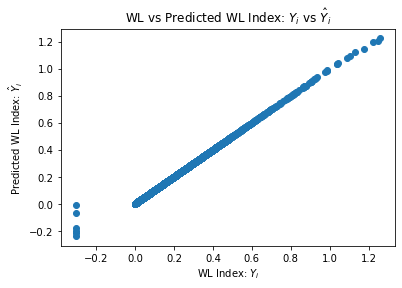

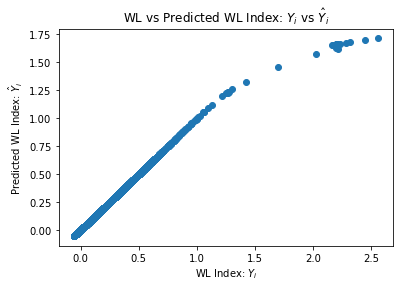

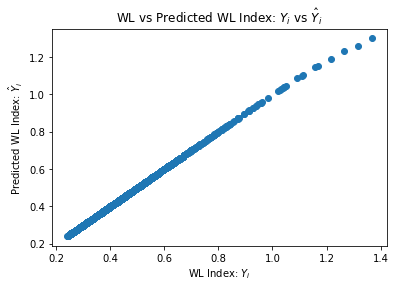

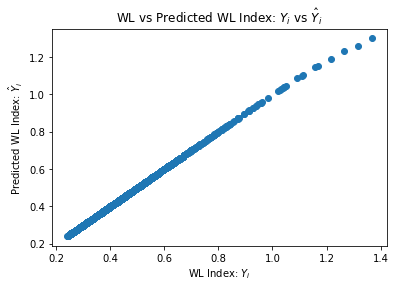

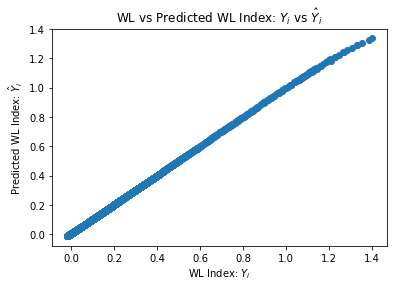

...

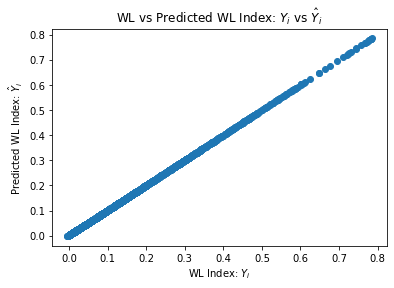

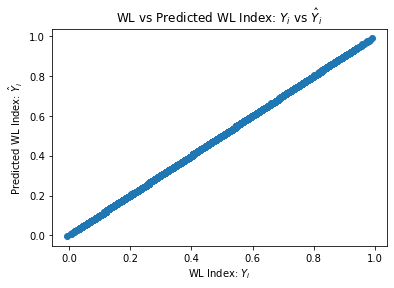

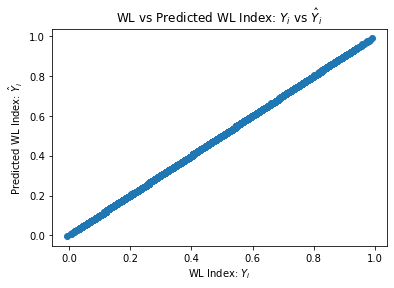

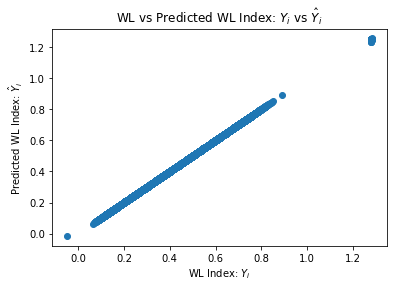

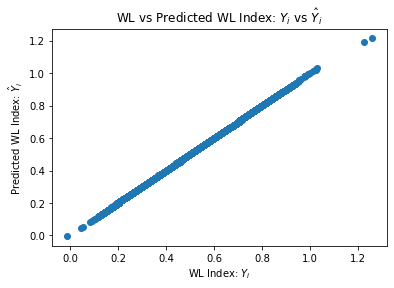

In [64]:
for i in range(len(df_list)):
    plt.scatter(y_test[i], y_pred[i])
    plt.xlabel("WL Index: $Y_i$")
    plt.ylabel("Predicted WL Index: $\hat{Y}_i$")
    plt.title("WL vs Predicted WL Index: $Y_i$ vs $\hat{Y}_i$")
    plt.show()

In [65]:
a_axis = [np.arange(0, len(y_train[i])) for i in range(len(df_list))]
b_axis = [np.arange(len(y_train[i]), len(y_train[i]) + len(y_pred[i])) for i in range(len(df_list))]

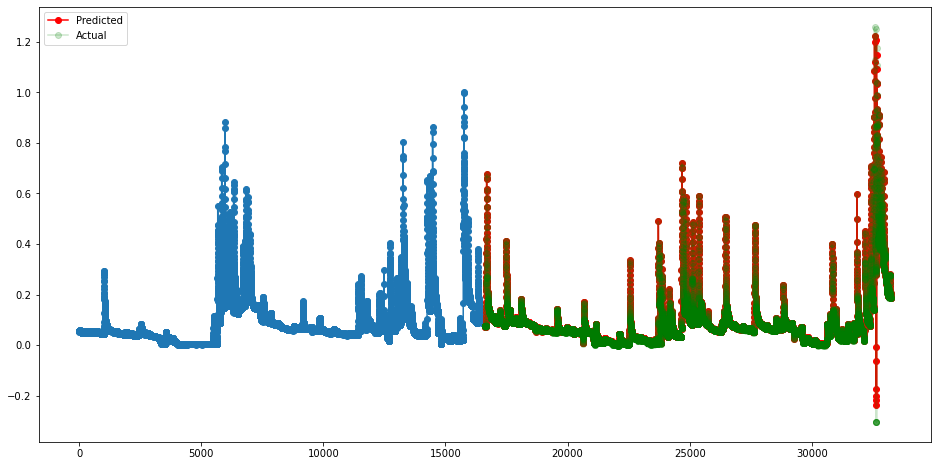

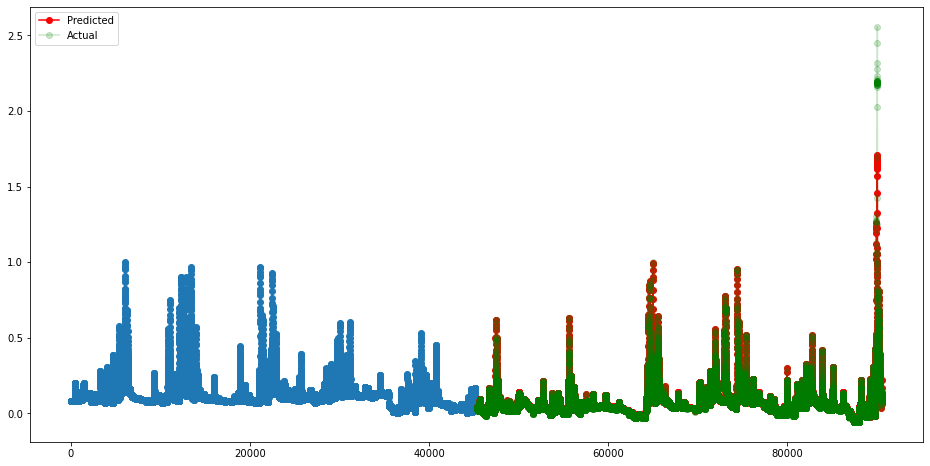

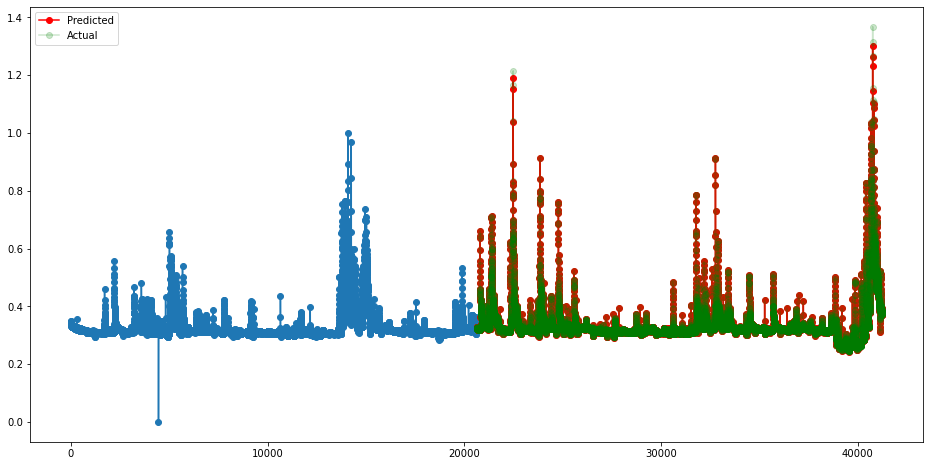

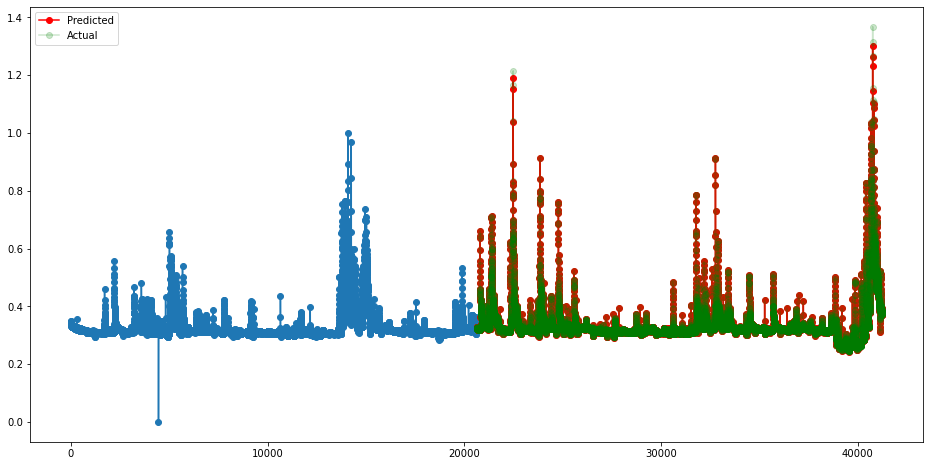

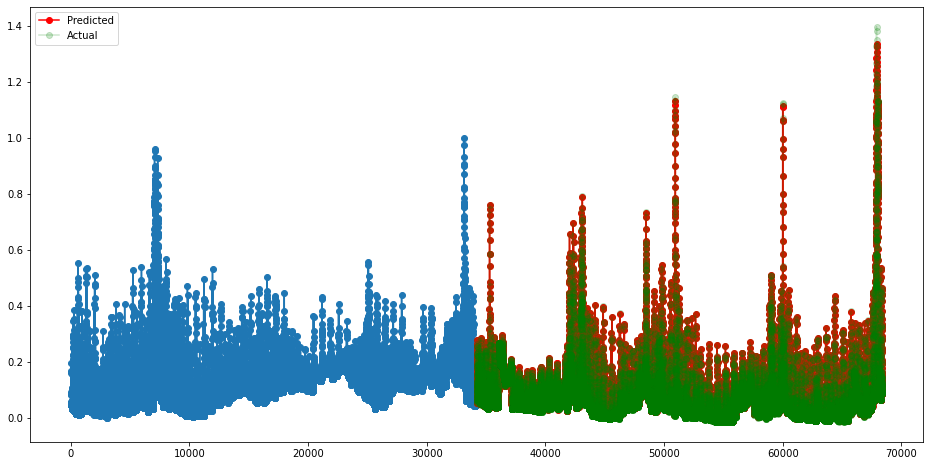

...

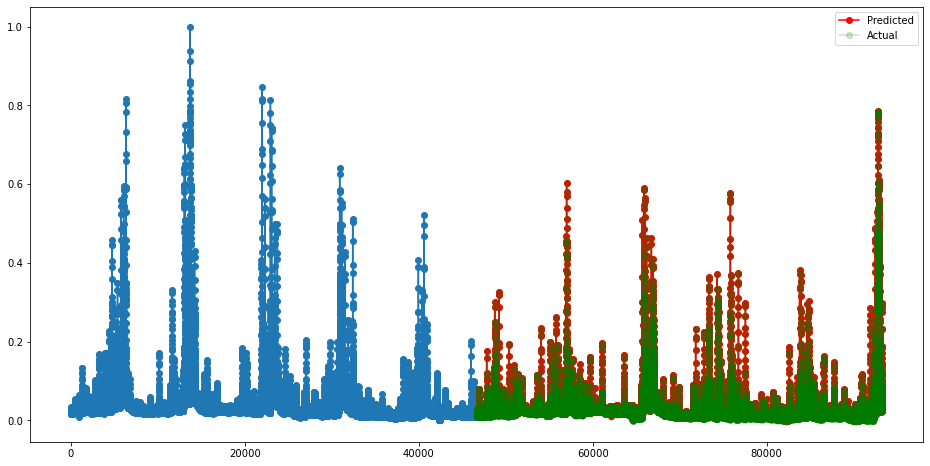

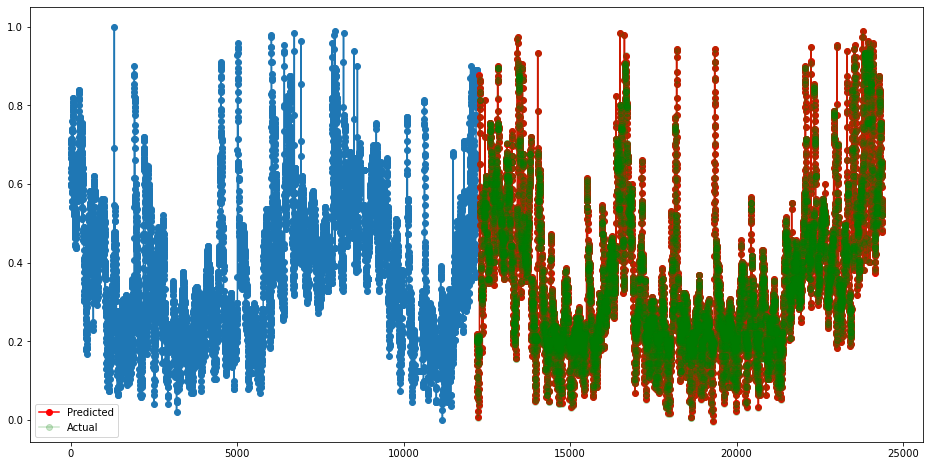

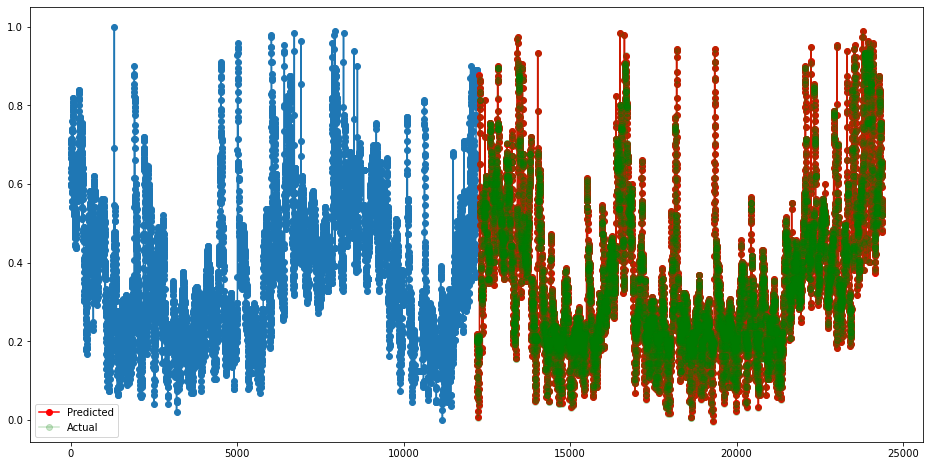

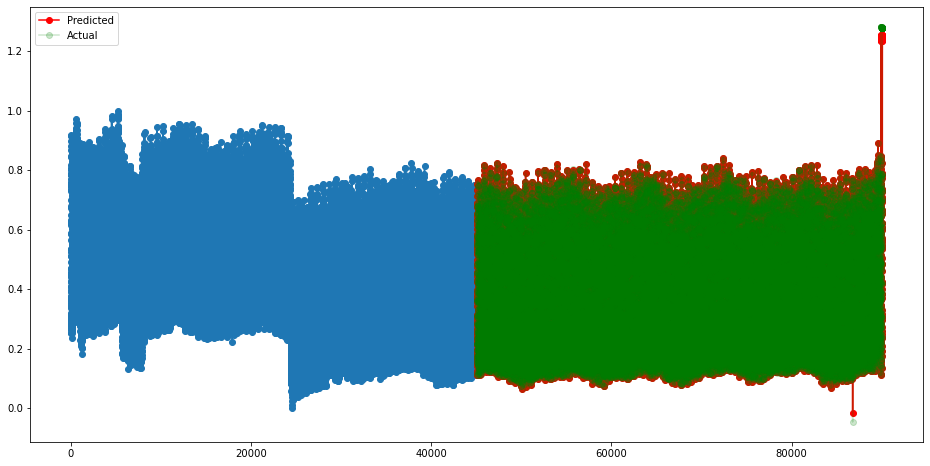

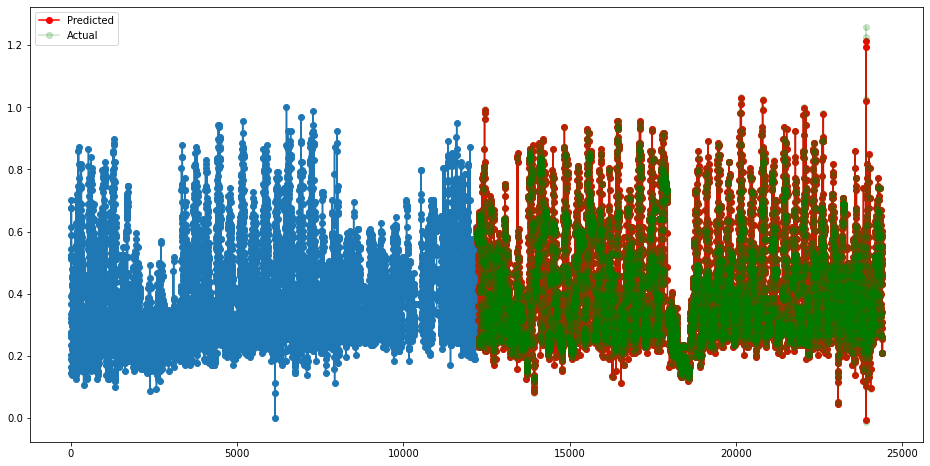

In [66]:
for i in range(len(df_list)):
    plt.figure(figsize=(16,8))
    plt.plot(a_axis[i], y_train[i].reshape(X_train_t[i].shape[0],), 'o-')
    plt.plot(b_axis[i], y_pred[i].reshape(X_test_t[i].shape[0],), 'o-', color='red', label='Predicted')
    plt.plot(b_axis[i], y_test[i].reshape(X_test_t[i].shape[0],), 'o-', color='green', alpha=0.2, label='Actual')
    plt.legend()
    plt.show()